<div style="padding:20px;color:#DEB078;margin:0;font-size:300%;text-align:center;display:fill;border-radius:5px;background-color:#213502;overflow:hidden;font-weight:800">🏢 Reservation Cancellation Prediction 🏢</div>

* About Dataset
    * Customer behavior and booking possibilities have been radically changed by online hotel reservation channels. 
    * Cancellations or no-shows cause a significant number of hotel reservations to be canceled. 
    * Cancellations can be caused by a variety of factors, such as scheduling conflicts, changes in plans, etc. 

## <b><div style='padding:15px;background-color:#213502;color:#DEB078;border-radius:2px;font-size:110%;text-align: center'>1  | Version</div></b>

* Version 1 

## <b><div style='padding:15px;background-color:#213502;color:#DEB078;border-radius:2px;font-size:110%;text-align: center'>2  |  Libraries & Dataset Setup</div></b>

### <b><span style='color:#DEB078'>2.1 |</span><span style='color:#213502'> Import Libraries</span></b>  

In [1]:
from IPython.display import clear_output
!pip3 install -U lazypredict
clear_output()

In [2]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os
import math
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.model_selection import cross_val_score,KFold,StratifiedKFold,RepeatedStratifiedKFold
from sklearn import metrics
from lazypredict.Supervised import LazyClassifier
from lightgbm import LGBMRegressor,LGBMClassifier
from sklearn.model_selection import train_test_split

### <b><span style='color:#DEB078'>2.2 |</span><span style='color:#213502'> Configure Properties</span></b>  

In [3]:
%matplotlib inline
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns',100)          
pd.set_option('display.max_rows',100)          
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
random_number =22
temp=dict(layout=go.Layout(font=dict(family="Franklin Gothic", size=12), height=500, width=1000))

### <b><span style='color:#DEB078'>2.3 |</span><span style='color:#213502'> Import Data</span></b>  

In [4]:
df_original_train=pd.read_csv("/kaggle/input/reservation-cancellation-prediction/train__dataset.csv")
df_original_test=pd.read_csv("/kaggle/input/reservation-cancellation-prediction/test___dataset.csv")
df_train=pd.read_csv("/kaggle/input/playground-series-s3e7/train.csv")
df_test=pd.read_csv("/kaggle/input/playground-series-s3e7/test.csv")

## <b><div style='padding:15px;background-color:#213502;color:#DEB078;border-radius:2px;font-size:110%;text-align: center'>3  |  Inspecting Dataframe Structure</div></b>

### <b><span style='color:#DEB078'>3.1 |</span><span style='color:#213502'> Structure Size</span></b>  

In [5]:
df_original_train.shape

(18137, 18)

In [6]:
df_original_test.shape

(18138, 17)

In [7]:
df_train.shape

(42100, 19)

In [8]:
df_test.shape

(28068, 18)

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>Insight:</b> From the above numbers we can see 1 extra column present in training data compared to original data</div>

### <b><span style='color:#DEB078'>3.2 |</span><span style='color:#213502'> Differences in structure</span></b>  

In [9]:
print('Column Present only in original ', set(df_original_train.columns).difference(set(df_train.columns)))
print('Column Present only in train    ', set(df_train.columns).difference(set(df_original_train.columns)))
print('Column Present only in test    ', set(df_test.columns).difference(set(df_original_train.columns)))

Column Present only in original  set()
Column Present only in train     {'id'}
Column Present only in test     {'id'}


In [10]:
df_train.drop(columns=['id'],inplace=True)
df_test.drop(columns=['id'],inplace=True)

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>Insight:</b> Similar Columns in Original and Competition Data except id Column</div>

### <b><span style='color:#DEB078'>3.3 |</span><span style='color:#213502'> Datatypes Available</span></b>  

In [11]:
pd.value_counts(df_original_train.dtypes)

int64      17
float64     1
dtype: int64

In [12]:
pd.value_counts(df_original_test.dtypes)

int64      16
float64     1
dtype: int64

In [13]:
pd.value_counts(df_train.dtypes)

int64      17
float64     1
dtype: int64

In [14]:
pd.value_counts(df_test.dtypes)

int64      16
float64     1
dtype: int64

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>Insight:</b> Same datatypes available in training as well as Original dataset</div>

### <b><span style='color:#DEB078'>3.4 |</span><span style='color:#213502'> Features Descriptions</span></b>  
* <b>Booking_ID</b> : unique identifier of each booking
* <b>No of adults</b> : Number of adults
* <b>No of children</b> : Number of Children
* <b>noofweekend_nights</b> : Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel
* <b>noofweek_nights</b> : Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel
* <b>typeofmeal_plan</b> : Type of meal plan booked by the customer:
* <b>requiredcarparking_space</b> : Does the customer require a car parking space? (0 - No, 1- Yes)
* <b>roomtypereserved</b> : Type of room reserved by the customer. The values are ciphered (encoded) by INN Hotels.
* <b>lead_time</b> : Number of days between the date of booking and the arrival date
* <b>arrival_year</b> : Year of arrival date
* <b>arrival_month</b> : Month of arrival date
* <b>arrival_date</b> : Date of the month
* <b>Market segment type</b> : Market segment designation.
* <b>repeated_guest</b> : Is the customer a repeated guest? (0 - No, 1- Yes)
* <b>noofprevious_cancellations</b> : Number of previous bookings that were canceled by the customer prior to the current booking
* <b>noofpreviousbookingsnot_canceled</b> : Number of previous bookings not canceled by the customer prior to the current booking
* <b>avgpriceper_room</b> : Average price per day of the reservation; prices of the rooms are dynamic. (in euros)
* <b>noofspecial_requests</b> : Total number of special requests made by the customer (e.g. high floor, view from the room, etc)
* <b>booking_status</b> : Flag indicating if the booking was canceled or not.

## <b><div style='padding:15px;background-color:#213502;color:#DEB078;border-radius:2px;font-size:110%;text-align: center'>4  | Dataframe Content Inspection</div></b>

### <b><span style='color:#DEB078'>4.1 |</span><span style='color:#213502'> Null Values Check</span></b>

In [15]:
 print("Number of Null Values in Original Train Set -> ",df_original_train.isna().any().sum())
print("Number of Null Values in Original Test Set -> ",df_original_test.isna().any().sum())
print("Number of Null Values in Competition Train Set -> ",df_train.isna().any().sum())
print("Number of Null Values in Competition Test Set -> ",df_test.isna().any().sum())

Number of Null Values in Original Train Set ->  0
Number of Null Values in Original Test Set ->  0
Number of Null Values in Competition Train Set ->  0
Number of Null Values in Competition Test Set ->  0


<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:82%;margin: auto;text-align: center;">
<b>Insight:</b> From the above Numbers  We see No null values present in original (train and test) Dataset as well as training (train and test) dataset</div>

### <b><span style='color:#DEB078'>4.2 |</span><span style='color:#213502'> Unique Values Check</span></b>

In [16]:
pd.concat([pd.DataFrame(df_original_train.nunique().sort_values()).rename(columns={0:'df_original_train'}),
pd.DataFrame(df_original_test.nunique().sort_values()).rename(columns={0:'df_original_test'}),
pd.DataFrame(df_train.nunique().sort_values()).rename(columns={0:'df_train'}),
pd.DataFrame(df_test.nunique().sort_values()).rename(columns={0:'df_test'})],axis=1)

,df_original_train,df_original_test,df_train,df_test
arrival_year,2,2.00,2,2.00
repeated_guest,2,2.00,2,2.00
required_car_parking_space,2,2.00,2,2.00
booking_status,2,NaN,2,NaN
type_of_meal_plan,4,4.00,4,4.00
market_segment_type,5,5.00,5,5.00
no_of_children,5,5.00,6,6.00
no_of_adults,5,5.00,5,5.00
no_of_special_requests,6,6.00,6,6.00
room_type_reserved,7,7.00,7,7.00


In [17]:
fig = make_subplots(rows=2, cols=2,shared_xaxes=True,
                    subplot_titles=("Unique values For Original Train Dataset","For Original Test Dataset",
                                    "For Competition Training Dataset","For Competition Test Dataset"))

temp_data=df_original_train.nunique().sort_values()

fig.add_trace(
    go.Bar(x=temp_data.index, y=temp_data.values,marker=dict(color='#54C0CC')),
    row=1, col=1
)

temp_data=df_original_test.nunique().sort_values()

fig.add_trace(
    go.Bar(x=temp_data.index, y=temp_data.values,marker=dict(color='#1F4F59')),
    row=1, col=2
)

temp_data=df_train.nunique().sort_values()

fig.add_trace(
    go.Bar(x=temp_data.index, y=temp_data.values,marker=dict(color='#7EA00E')),
    row=2, col=1
)


temp_data=df_test.nunique().sort_values()

fig.add_trace(
    go.Bar(x=temp_data.index, y=temp_data.values,marker=dict(color='#DCD964')),
    row=2, col=2
)

fig.update_layout(height=700)
fig.show()

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:82%;margin: auto;text-align: center;">
<b>Insight:</b> From the above plot, we see unique values present in original Dataset as well as training dataset is approx similliar in distribution across datasets</div>

### <b><span style='color:#DEB078'>4.3 |</span><span style='color:#213502'> Value Behaviour for Original Train Data</span></b>

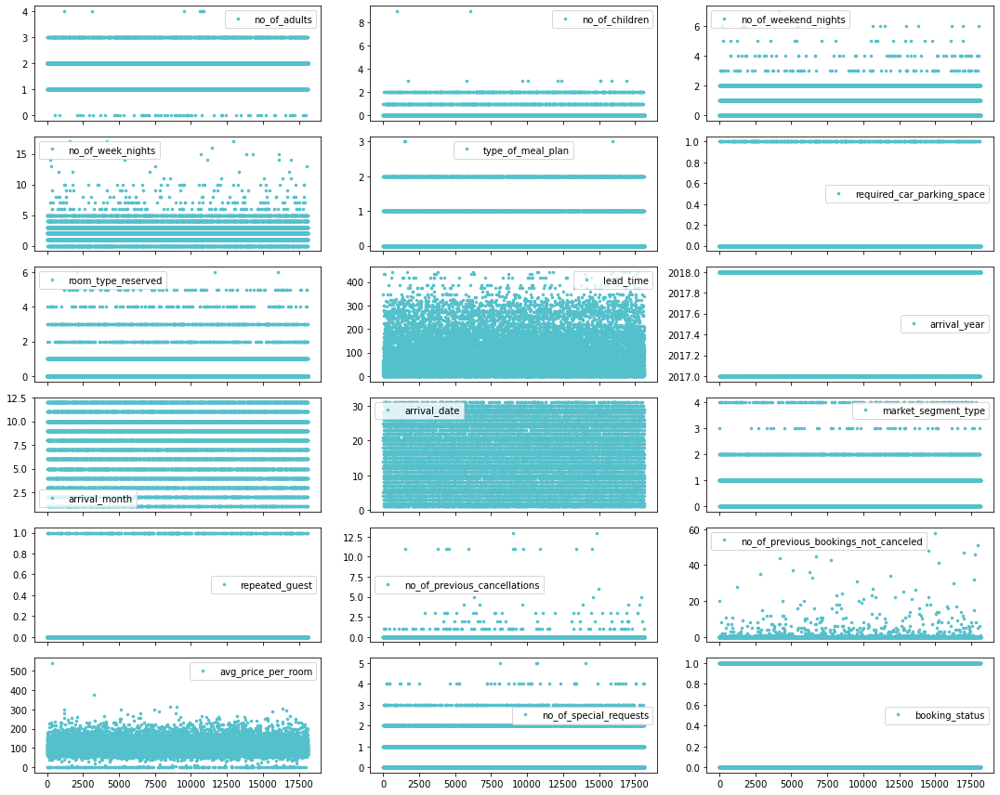

In [18]:
#### For all Numerical columnn for all rows 
df_original_train.plot(lw=0, marker=".", subplots=True, layout=(-1, 3),
          figsize=(15,12), markersize=5,color='#54C0CC')
plt.tight_layout()

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:82%;margin: auto;text-align: center;">
<b>Insight:</b> There are columns present with datatype as int but with few distinct categories like repeated_guest etc , Extreme values also present in some cases </div>

### <b><span style='color:#DEB078'>4.4 |</span><span style='color:#213502'> Value Behaviour for Original Test Data</span></b>

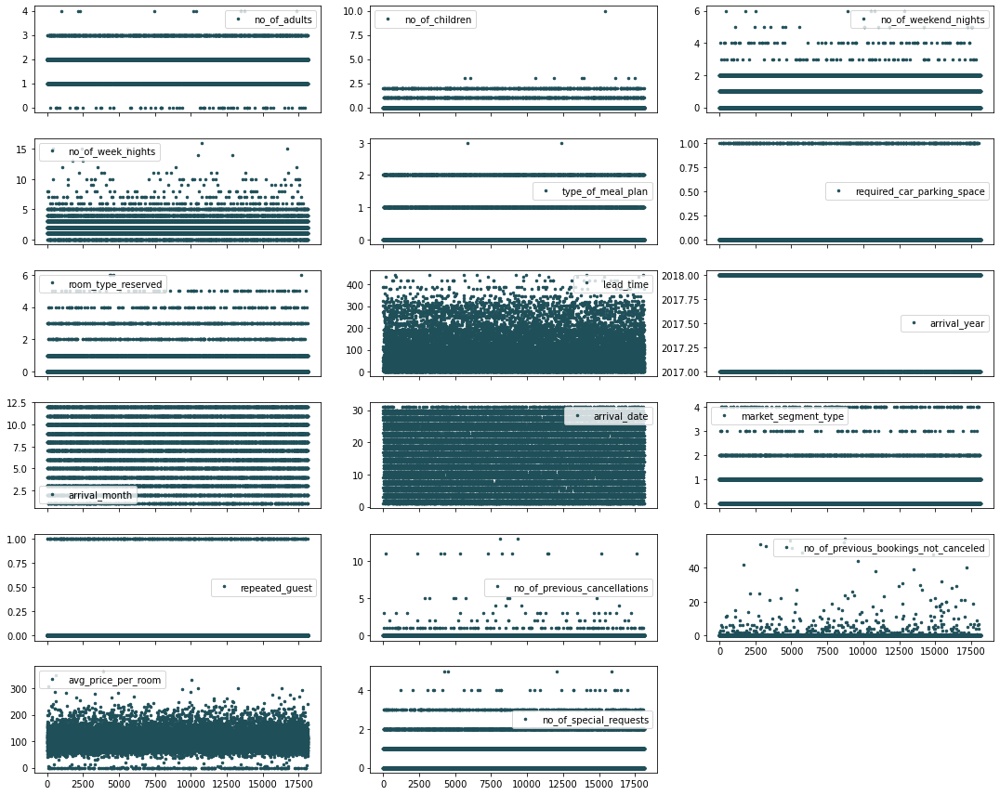

In [19]:
#### For all Numerical columnn for all rows 
df_original_test.plot(lw=0, marker=".", subplots=True, layout=(-1, 3),
          figsize=(15,12), markersize=5,color='#1F4F59')
plt.tight_layout()

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:82%;margin: auto;text-align: center;">
<b>Insight:</b> There are columns present with datatype as int but with few distinct categories like repeated_guest etc , Extreme values also present in some cases </div>

### <b><span style='color:#DEB078'>4.5 |</span><span style='color:#213502'> Value Behaviour for Train Data</span></b>

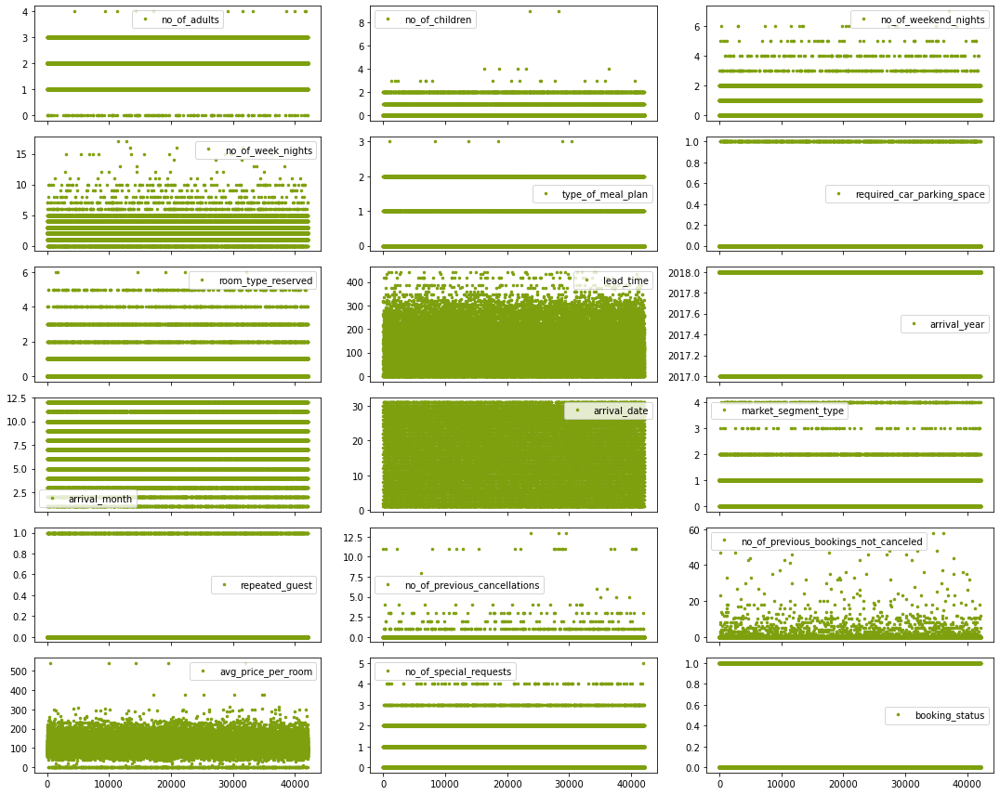

In [20]:
# For all Numerical columnn for all rows 
df_train.plot(lw=0, marker=".", subplots=True, layout=(-1, 3),
          figsize=(15,12), markersize=5,color='#7EA00E')
plt.tight_layout()

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:82%;margin: auto;text-align: center;">
<b>Insight:</b> There are columns present with datatype as int but with few distinct categories like repeated_guest etc , Extreme values also present in some cases </div>

### <b><span style='color:#DEB078'>4.6 |</span><span style='color:#213502'> Value Behaviour for Test Data</span></b>

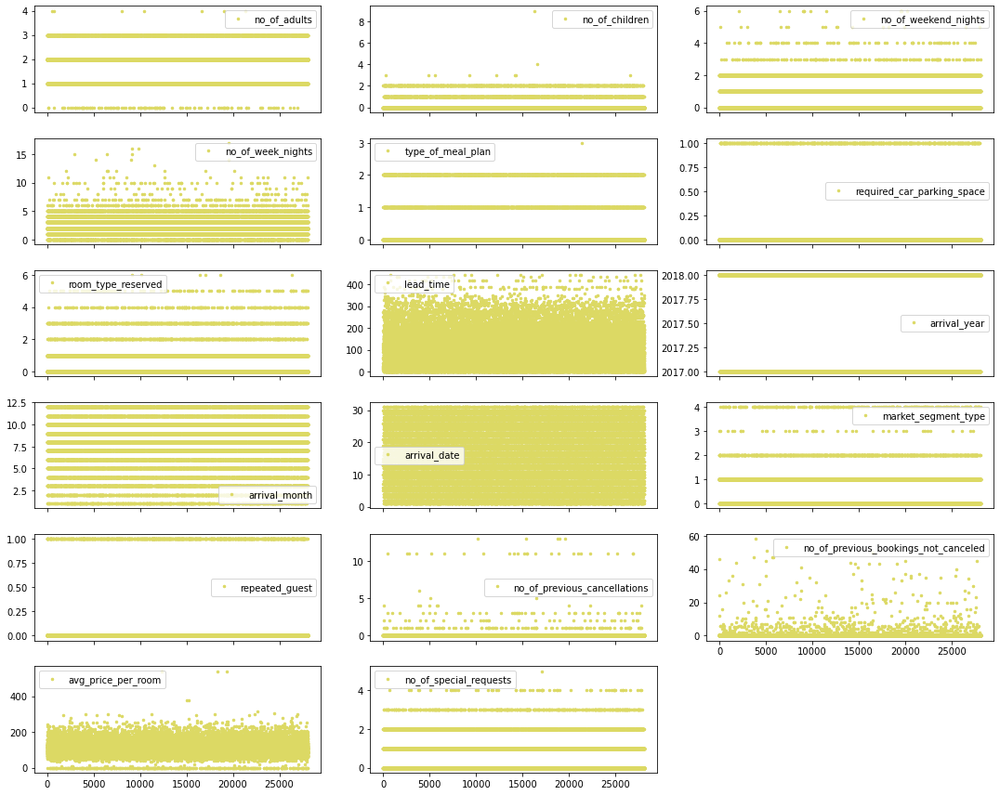

In [21]:
# For all Numerical columnn for all rows 
df_test.plot(lw=0, marker=".", subplots=True, layout=(-1, 3),
          figsize=(15,12), markersize=5,color='#DCD964')
plt.tight_layout()

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:82%;margin: auto;text-align: center;">
<b>Insight:</b> There are columns present with datatype as int but with few distinct categories like repeated_guest etc , Extreme values also present in some cases </div>

## <b><div style='padding:15px;background-color:#213502;color:#DEB078;border-radius:2px;font-size:110%;text-align: center'>5 | Target Variable Analysis</div></b>

### <b><span style='color:#DEB078'>5.1 |</span><span style='color:#213502'> For Original Train Data</span></b>

In [22]:
target=df_original_train[['booking_status']].value_counts(normalize=True).sort_index().round(decimals=3)*100

pal, color=['#54C0CC','#1F4F59'], ['#54C0CC','#1F4F59']
fig=go.Figure()

fig.add_trace(go.Pie(labels=target.index, values=target, hole=.5, 
                     showlegend=True,sort=False, 
                     marker=dict(colors=color,line=dict(color=pal,width=2.5)),
                     hovertemplate = "%{label} Booking Status: %{value:.2f}%<extra></extra>"))

fig.update_layout(template=temp, title='Target Distribution', 
                  legend=dict(traceorder='reversed',y=1.05,x=0),
                  uniformtext_minsize=15, uniformtext_mode='hide',height=500)
fig.show()


<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>Insight:</b> More number of not cancelled rows present (over 2/3)</div>

### <b><span style='color:#DEB078'>5.2 |</span><span style='color:#213502'> For Competition Train Data</span></b>

In [23]:
target=df_train[['booking_status']].value_counts(normalize=True).sort_index().round(decimals=3)*100

pal, color=['#7EA00E','#DCD964'], ['#7EA00E','#DCD964']
fig=go.Figure()

fig.add_trace(go.Pie(labels=target.index, values=target, hole=.5, 
                     showlegend=True,sort=False, 
                     marker=dict(colors=color,line=dict(color=pal,width=2.5)),
                     hovertemplate = "%{label} Booking Status: %{value:.2f}%<extra></extra>"))

fig.update_layout(template=temp, title='Target Distribution', 
                  legend=dict(traceorder='reversed',y=1.05,x=0),
                  uniformtext_minsize=15, uniformtext_mode='hide',height=500)
fig.show()


<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>Insight:</b> More number of not cancelled rows present (below 2/3)</div>

## <b><div style='padding:15px;background-color:#213502;color:#DEB078;border-radius:2px;font-size:110%;text-align: center'>6 | Univariate Analysis</div></b>

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>Criteria Considered:</b><br> Categorical Beahviour Column which are having distinct value less then equal to 32 <br>
    Categorical Beahviour Column which are having distinct greater then 32 <br>
</div>

### <b><span style='color:#DEB078'>6.1 |</span><span style='color:#213502'> Individual Column Distribution Across Dataset (Categorical Behaviour) </span></b>

In [24]:
cat_threshold=32
cols=df_test.nunique()[df_test.nunique() <=cat_threshold].index.tolist()
cols

['no_of_adults',
 'no_of_children',
 'no_of_weekend_nights',
 'no_of_week_nights',
 'type_of_meal_plan',
 'required_car_parking_space',
 'room_type_reserved',
 'arrival_year',
 'arrival_month',
 'arrival_date',
 'market_segment_type',
 'repeated_guest',
 'no_of_previous_cancellations',
 'no_of_special_requests']

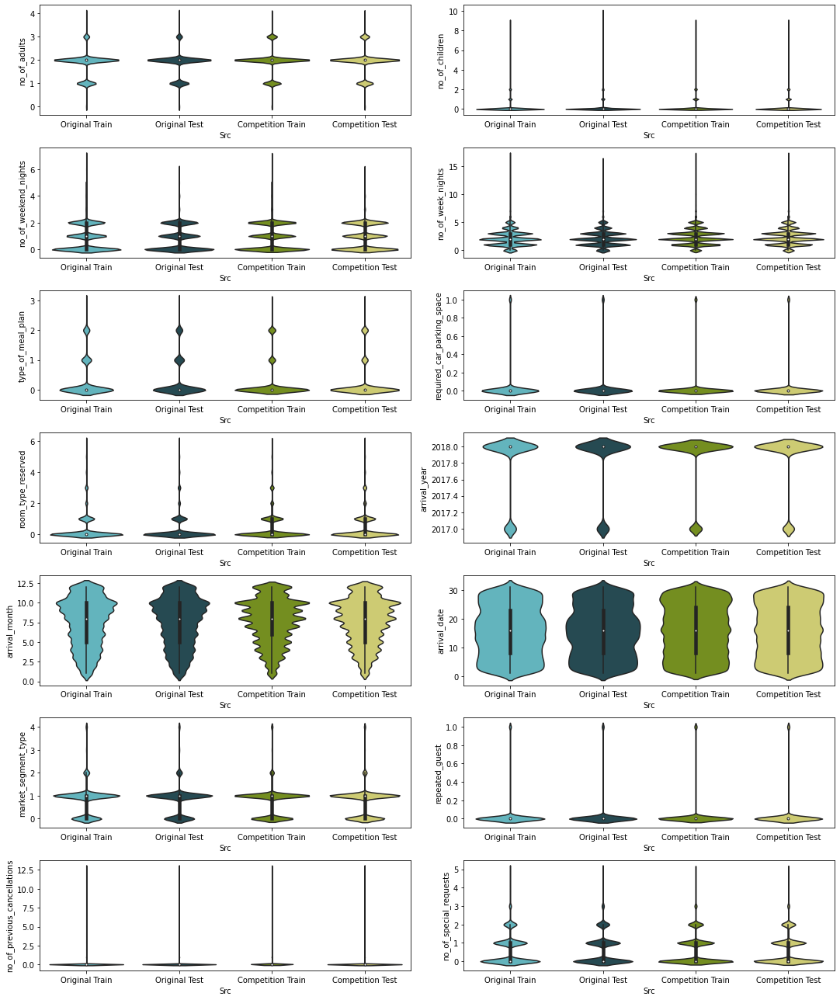

In [25]:
t1=df_original_train[cols]
t1['Src']='Original Train'

t2=df_original_test[cols]
t2['Src']='Original Test'

t3=df_train[cols]
t3['Src']='Competition Train'

t4=df_test[cols]
t4['Src']='Competition Test'

t4=pd.concat([t1,t2,t3,t4]).reset_index(drop=True)

y=2
x=math.ceil((len(cols)-1)/y)

plt.subplots(x,y,figsize=(15,18))

for i in range(1,len(cols)+1) :
    plt.subplot(x,y,i)
    sns.violinplot(data=t4,y=cols[i-1],x='Src', palette=['#54C0CC','#1F4F59','#7EA00E','#DCD964'])

plt.tight_layout()    
plt.show()

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>Insight:</b><br> Train and test of Original share almost same distribution across all columns. <br>In few columns shape varies between Original and Competition Data </div>

### <b><span style='color:#DEB078'>6.2 |</span><span style='color:#213502'> Individual Column Distribution Across Dataset (Numerical Behaviour) </span></b>

In [26]:
cat_threshold=32
cols=df_test.nunique()[df_test.nunique() >cat_threshold].index.tolist()
print (cols)

['lead_time', 'no_of_previous_bookings_not_canceled', 'avg_price_per_room']


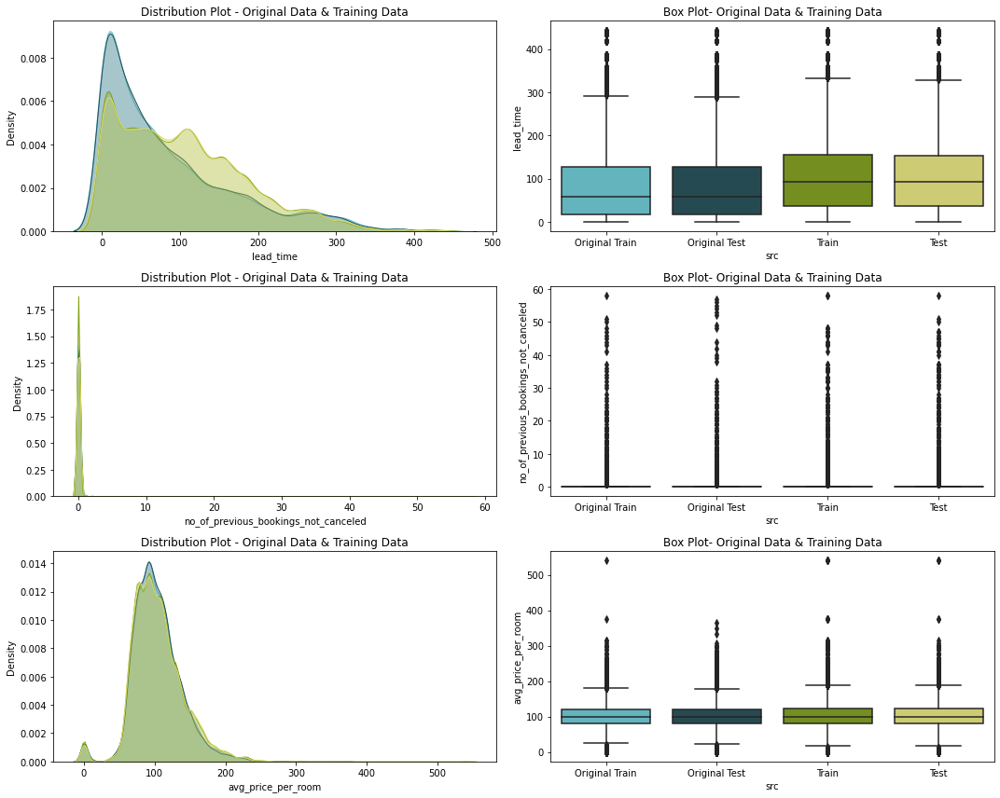

In [27]:
ncols = 2
cont_features=cols

nrows = len(cont_features)
df_temp=pd.concat([df_original_train.assign(src='Original Train'),df_original_test.assign(src='Original Test'),df_train.assign(src='Train'),df_test.assign(src='Test')])
fig, axes = plt.subplots(nrows, ncols, figsize=(15, 4*nrows))

for r in range(nrows):
    row = cont_features[r]
   
    sns.kdeplot(x=df_original_train[row], ax=axes[r,0], color='#54C0CC', label='Test data', fill =True)
    sns.kdeplot(x=df_original_test[row], ax=axes[r,0], color='#1F4F59', label='Test data', fill =True)
    sns.kdeplot(x=df_train[row], ax=axes[r,0], color='#7EA00E', label='Train data' , fill =True )
    sns.kdeplot(x=df_test[row], ax=axes[r,0], color='#DCD964', label='Test data', fill =True)
    
    sns.boxplot(data=df_temp, y=row,x='src' ,ax=axes[r,1],palette=['#54C0CC','#1F4F59','#7EA00E','#DCD964'])


    axes[r,0].title.set_text("Distribution Plot - Original Data & Training Data")
    axes[r,1].title.set_text("Box Plot- Original Data & Training Data")
fig.tight_layout()
plt.show()

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>Insight:</b> <br>Distribution Spread different for lead_time . Competition data having higher median then the Original Data<br>
Outliers present in both Competition Data and Original Data
</div>

### <b><span style='color:#DEB078'>6.3 |</span><span style='color:#213502'> Individual Column Value Observation (Outlier using IQR)</span></b>

In [28]:
upper_org_train =df_original_train.quantile(0.75)+1.5 *(df_original_train.quantile(0.75)-df_original_train.quantile(0.25))
lower_org_train = df_original_train.quantile(0.25)-1.5 *(df_original_train.quantile(0.75)-df_original_train.quantile(0.25))

upper_org_test =df_original_test.quantile(0.75)+1.5 *(df_original_test.quantile(0.75)-df_original_test.quantile(0.25))
lower_org_test = df_original_test.quantile(0.25)-1.5 *(df_original_test.quantile(0.75)-df_original_test.quantile(0.25))


upper_train =df_train.quantile(0.75)+1.5 *(df_train.quantile(0.75)-df_train.quantile(0.25))
lower_train = df_train.quantile(0.25)-1.5 *(df_train.quantile(0.75)-df_train.quantile(0.25))

upper_test =df_test.quantile(0.75)+1.5 *(df_test.quantile(0.75)-df_test.quantile(0.25))
lower_test = df_test.quantile(0.25)-1.5 *(df_test.quantile(0.75)-df_test.quantile(0.25))



cols.remove('no_of_previous_bookings_not_canceled')
columns_to_be_checked=cols


for i in columns_to_be_checked:

    
    print('\nColumn -> ',i,'\n')
    
    x= df_original_train[ (df_original_train[i]<round(lower_org_train[i],2)) |  (df_original_train[i]>round(upper_org_train[i],2))][i].to_list()
    print('Skewness -> ',round(df_original_train[i].skew(),3) ,' | Outliers presesnt in Original Train Dataset -> ',len(x),'  Out of Total -> ',len(df_original_train))
    
    
    x= df_original_test[ (df_original_test[i]<round(lower_org_test[i],2)) |  (df_original_test[i]>round(upper_org_test[i],2))][i].to_list()
    print('Skewness -> ',round(df_original_test[i].skew(),3) ,' | Outliers presesnt in Original Test Dataset -> ',len(x),'  Out of Total -> ',len(df_original_test))
          
    
    x= df_train[ (df_train[i]<round(lower_train[i],2)) |  (df_train[i]>round(upper_train[i],2))][i].to_list()
    print('Skewness -> ',round(df_train[i].skew(),3) ,' | Outliers presesnt in Training Dataset -> ',len(x),'  Out of Total -> ',len(df_train))
          
    x= df_test[ (df_test[i]<round(lower_test[i],2)) |  (df_test[i]>round(upper_test[i],2))][i].to_list()
    print('Skewness -> ',round(df_test[i].skew(),3) ,' | Outliers presesnt in Test Dataset -> ',len(x),'  Out of Total -> ',len(df_test))
          
          
    print('\n','*'*10)


Column ->  lead_time 

Skewness ->  1.296  | Outliers presesnt in Original Train Dataset ->  616   Out of Total ->  18137
Skewness ->  1.289  | Outliers presesnt in Original Test Dataset ->  655   Out of Total ->  18138
Skewness ->  0.824  | Outliers presesnt in Training Dataset ->  380   Out of Total ->  42100
Skewness ->  0.845  | Outliers presesnt in Test Dataset ->  264   Out of Total ->  28068

 **********

Column ->  avg_price_per_room 

Skewness ->  0.71  | Outliers presesnt in Original Train Dataset ->  873   Out of Total ->  18137
Skewness ->  0.621  | Outliers presesnt in Original Test Dataset ->  810   Out of Total ->  18138
Skewness ->  0.885  | Outliers presesnt in Training Dataset ->  1798   Out of Total ->  42100
Skewness ->  0.849  | Outliers presesnt in Test Dataset ->  1140   Out of Total ->  28068

 **********


<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>Insight:</b><br> * Around 5% values are outlier in avg_price_per_room<br>
* High % of outliers in original data compared to competition data for lead_time column
</div>

In [29]:
def adversial_validation(df1 , df2, df1_identifier, df2_identifier, random_number):

    combined_df = df1.assign(isdf1 = 1).append(df2.assign(isdf1 = 0));

    model = LGBMClassifier()
    
    combined_df.sample(frac = 1, random_state = random_number);
    
    cv = RepeatedStratifiedKFold(n_splits = 10, n_repeats = 10, random_state = random_number);
    
    scores = cross_val_score(model, combined_df.drop(columns = 'isdf1'), y= combined_df['isdf1'].values, 
                             scoring= 'roc_auc', cv= cv, n_jobs= -1);
    
    
    score = np.mean(scores)
    
    print("Adversial Validation Result Between ",df1_identifier," & ", df2_identifier ," = ", score)
    
    del combined_df, scores,score, model;

In [30]:
adversial_validation(df_train.drop(columns='booking_status'), df_test, "Train", 'Test',random_number)
adversial_validation(df_train.drop(columns='booking_status'), df_original_train.drop(columns='booking_status'), "Train", 'Original',random_number)
adversial_validation(df_test, df_original_train.drop(columns='booking_status'), "Test", 'Original',random_number)

Adversial Validation Result Between  Train  &  Test  =  0.49830380580536565
Adversial Validation Result Between  Train  &  Original  =  0.7319682703320537
Adversial Validation Result Between  Test  &  Original  =  0.7279834910311516


<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;">
* Original Data and Competition data are different as they got separated out by lgbm classifier with 73% roc_auc score <br>
* It can be due to some fields having different value present in Original data compared to Competition.
</div>

## <b><div style='padding:15px;background-color:#213502;color:#DEB078;border-radius:2px;font-size:110%;text-align: center'>7 | Booking Status Relation with Categorical Variable</div></b>

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>Criteria Considered:</b><br> Categorical Beahviour Column which are having distinct value less then equal to 32 <br>
    Numerical Beahviour Column which are having distinct greater then 32 <br>
</div>

In [31]:
# Helping Function
def stats(x):
    train=df_train
    temp1=(train[[x,'booking_status']].value_counts(normalize=True).round(decimals=3)*100).reset_index().rename(columns={0:'Overall_Percent'})
    Coloumn_To_Aggregate=[x,'booking_status']
    df6=pd.merge(train.groupby(Coloumn_To_Aggregate).size().reset_index(name='ind_siz'), 
                 train.groupby(Coloumn_To_Aggregate[:-1]).size().reset_index(name='Total'), on =Coloumn_To_Aggregate[:-1])
    df6['Category_Percent']=round((df6['ind_siz']/df6['Total'])*100 ,2)
    temp2=df6[[x,'booking_status','Category_Percent']]
    temp3=temp1.merge(temp2,on=[x,'booking_status'])
    return temp3.pivot(columns=x,index='booking_status')
    del train

In [32]:
cat_threshold=32
cols=df_test.nunique()[df_test.nunique() <=cat_threshold].index.tolist()
cols

['no_of_adults',
 'no_of_children',
 'no_of_weekend_nights',
 'no_of_week_nights',
 'type_of_meal_plan',
 'required_car_parking_space',
 'room_type_reserved',
 'arrival_year',
 'arrival_month',
 'arrival_date',
 'market_segment_type',
 'repeated_guest',
 'no_of_previous_cancellations',
 'no_of_special_requests']

In [33]:
df_train[['booking_status']].value_counts(normalize=True).sort_index().round(decimals=3)*100

booking_status
0                60.80
1                39.20
dtype: float64

### <b><span style='color:#DEB078'>7.1 |</span><span style='color:#213502'> Arrival_Month Relation with Booking_Status</span></b>

In [34]:
px.histogram(df_train, x='arrival_month', color="booking_status", barmode='group',color_discrete_sequence=['#54C0CC','#1F4F59'])

In [35]:
stats('arrival_month')

Overall_Percent                                               \
arrival_month               1    2    3    4    5    6    7    8    9    10   
booking_status                                                                
0                         1.80 2.10 3.70 4.60 4.60 4.60 5.90 6.50 7.10 8.40   
1                         0.10 0.80 1.50 2.60 3.20 3.40 5.30 7.20 5.10 6.90   

                         Category_Percent                                      \
arrival_month    11   12               1     2     3     4     5     6     7    
booking_status                                                                  
0              4.80 6.70            92.80 73.61 71.65 64.01 59.39 57.96 52.62   
1              1.80 1.30             7.20 26.39 28.35 35.99 40.61 42.04 47.38   

                                              
arrival_month     8     9     10    11    12  
booking_status                                
0              47.23 57.91 54.70 72.39 83.72  
1              52.77 42.09 45.30 27.61 16.28

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>INSIGHT</b><br>
October is most common with 15.3% out of all records<br>
Out of 39.2 % (Cancelled) bookings around 7.2% of them were from August <br>
Out of 60.8 % (Not Cancelled) bookings around 8.4% of them were from October<br>
In August 52.77% times booking get cancelled
</div>

### <b><span style='color:#DEB078'>7.2 |</span><span style='color:#213502'> Arrival_Year Relation with Booking_Status</span></b>

In [36]:
px.histogram(df_train, x='arrival_year', color="booking_status", barmode='group',color_discrete_sequence=['#7EA00E','#DCD964'])

In [37]:
stats('arrival_year')

Overall_Percent       Category_Percent      
arrival_year              2017  2018             2017  2018
booking_status                                             
0                        11.80 49.00            82.05 57.23
1                         2.60 36.60            17.95 42.77

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>INSIGHT</b><br>
2018 is most common with 85.6% out of all records<br>
Out of 39.2 % (Cancelled) bookings around 36.6% of them were from 2018 <br>
Out of 60.8 % (Not Cancelled) bookings around 49.0% of them were from 2018<br>
</div>

### <b><span style='color:#DEB078'>7.3 |</span><span style='color:#213502'> Arrival_Date Relation with Booking_Status</span></b>

In [38]:
px.histogram(df_train, x='arrival_date', color="booking_status", barmode='group',color_discrete_sequence=['#54C0CC','#1F4F59'])

In [39]:
stats('arrival_date')

Overall_Percent                                               \
arrival_date                1    2    3    4    5    6    7    8    9    10   
booking_status                                                                
0                         1.90 2.20 1.90 2.00 2.10 1.90 1.80 2.10 2.10 1.90   
1                         1.50 1.10 1.20 1.40 1.10 1.50 1.10 1.20 1.30 1.10   

                                                                            \
arrival_date     11   12   13   14   15   16   17   18   19   20   21   22   
booking_status                                                               
0              1.80 1.80 2.30 1.80 1.70 2.10 2.10 2.00 1.90 2.20 2.00 1.70   
1              1.20 1.40 1.20 1.00 1.60 1.70 1.30 1.10 1.20 1.20 1.20 1.30   

                                                            Category_Percent  \
arrival_date     23   24   25   26   27   28   29   30   31               1    
booking_status                                                                 
0              1.90 1.80 2.20 2.10 2.50 1.80 2.10 2.10 1.00            55.53   
1              1.30 1.10 1.30 1.30 1.40 1.50 1.20 1.60 0.60            44.47   

                                                                            \
arrival_date      2     3     4     5     6     7     8     9     10    11   
booking_status                                                               
0              66.41 61.25 59.74 64.81 55.19 62.52 63.81 62.01 62.25 60.02   
1              33.59 38.75 40.26 35.19 44.81 37.48 36.19 37.99 37.75 39.98   

                                                                            \
arrival_date      12    13    14    15    16    17    18    19    20    21   
booking_status                                                               
0              57.28 65.38 64.35 51.67 55.69 62.27 63.98 61.22 65.27 63.35   
1              42.72 34.62 35.65 48.33 44.31 37.73 36.02 38.78 34.73 36.65   

                                                                            
arrival_date      22    23    24    25    26    27    28    29    30    31  
booking_status                                                              
0              55.57 60.36 61.25 63.58 61.30 64.18 53.51 62.72 57.54 62.38  
1              44.43 39.64 38.75 36.42 38.70 35.82 46.49 37.28 42.46 37.62

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>INSIGHT</b><br>
27 is most common with 3.9% out of all records<br>
Out of 39.2 % (Cancelled) bookings around 1.7% of them had date 16 <br>
Out of 60.8 % (Not Cancelled) bookings around 2.5% of them had date 27<br>
</div>

### <b><span style='color:#DEB078'>7.4 |</span><span style='color:#213502'> No_of_Adults Relation with Booking_Status</span></b>

In [40]:
px.histogram(df_train, x='no_of_adults', color="booking_status", barmode='group',color_discrete_sequence=['#7EA00E','#DCD964'])

In [41]:
stats('no_of_adults')

Overall_Percent                       Category_Percent        \
no_of_adults                 0     1     2    3    4                0     1   
booking_status                                                                
0                         0.30 12.10 42.70 5.70 0.00            64.07 71.79   
1                         0.10  4.80 30.40 3.90 0.00            35.93 28.21   

                                  
no_of_adults       2     3     4  
booking_status                    
0              58.47 59.12 50.00  
1              41.53 40.88 50.00

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>INSIGHT</b><br>
2 is most common with 73.1% out of all records<br>
Out of 39.2 % (Cancelled) bookings around 30.4% of them had 2 adults<br>
Out of 60.8 % (Not Cancelled) bookings around 42.7% of them had 2 adults<br>
For 1 Adult  - 71.79% times booking get confirmed (and 28.21% times cancelled)<br>
For 2 Adults - 41.53% times bookings get cancelled (and 58.47% times not cancelled)
</div>

### <b><span style='color:#DEB078'>7.5 |</span><span style='color:#213502'> No_of_Children Relation with Booking_Status</span></b>

In [42]:
px.histogram(df_train, x='no_of_children', color="booking_status", barmode='group',color_discrete_sequence=['#54C0CC','#1F4F59'])

In [43]:
stats('no_of_children')

Overall_Percent                          Category_Percent  \
no_of_children               0    1    2    3    4    9                0   
booking_status                                                             
0                        54.60 4.00 2.20 0.00 0.00 0.00            60.84   
1                        35.10 2.50 1.50 0.00 0.00  NaN            39.16   

                                               
no_of_children     1     2     3     4      9  
booking_status                                 
0              61.38 58.42 76.47 80.00 100.00  
1              38.62 41.58 23.53 20.00    NaN

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>INSIGHT</b><br>
0 is most common with 89.7% out of all records<br>
Out of 39.2 % (Cancelled) bookings around 35.1% of them had 0 children<br>
Out of 60.8 % (Not Cancelled) bookings around 54.6% of them had 0 children<br>
For 2 Children - 41.58% times bookings get cancelled (and 58.42% times not cancelled)
</div>

### <b><span style='color:#DEB078'>7.6 |</span><span style='color:#213502'> No_of_Weekend_Nights relation with Booking_Status</span></b>

In [44]:
px.histogram(df_train, x='no_of_weekend_nights', color="booking_status", barmode='group',color_discrete_sequence=['#7EA00E','#DCD964'])

In [45]:
stats('no_of_weekend_nights')

Overall_Percent                                       \
no_of_weekend_nights               0     1     2    3    4    5    6    7   
booking_status                                                              
0                              27.30 16.00 17.00 0.30 0.10 0.10 0.00 0.00   
1                              15.80 11.00 11.90 0.30 0.20 0.00 0.00  NaN   

                     Category_Percent                                      \
no_of_weekend_nights                0     1     2     3     4     5     6   
booking_status                                                              
0                               63.31 59.29 58.82 52.72 42.97 60.87 52.94   
1                               36.69 40.71 41.18 47.28 57.03 39.13 47.06   

                             
no_of_weekend_nights      7  
booking_status               
0                    100.00  
1                       NaN

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>INSIGHT</b><br>
0 is most common with 43.1% out of all records<br>
Out of 39.2 % (Cancelled) Bookings around 15.8% of them had 0 <br>
Out of 60.8 % (Not Cancelled) Bookings around 27.3% of them had 0<br>
</div>

### <b><span style='color:#DEB078'>7.7 |</span><span style='color:#213502'> No_of_Week_Nights relation with Booking_Status</span></b>

In [46]:
px.histogram(df_train, x='no_of_week_nights', color="booking_status", barmode='group',color_discrete_sequence=['#54C0CC','#1F4F59'])

In [47]:
stats('no_of_week_nights')

Overall_Percent                                             \
no_of_week_nights              0     1     2     3    4    5    6    7    8    
booking_status                                                                 
0                            2.80 14.50 19.10 15.00 5.60 3.10 0.20 0.20 0.10   
1                            1.80  8.20 11.60  9.40 4.30 3.00 0.30 0.20 0.10   

                                                                \
no_of_week_nights   9    10   11   12   13   14   15   16   17   
booking_status                                                   
0                 0.10 0.10 0.00 0.00 0.00 0.00 0.00 0.00 0.00   
1                 0.10 0.10 0.00 0.00 0.00 0.00 0.00 0.00  NaN   

                  Category_Percent                                            \
no_of_week_nights               0     1     2     3     4     5     6     7    
booking_status                                                                 
0                            59.94 63.75 62.15 61.56 56.26 51.46 44.30 47.50   
1                            40.06 36.25 37.85 38.44 43.74 48.54 55.70 52.50   

                                                                                
no_of_week_nights    8     9     10    11    12    13    14    15    16     17  
booking_status                                                                  
0                 39.29 54.72 50.00 62.50 66.67 60.00 66.67 72.73 25.00 100.00  
1                 60.71 45.28 50.00 37.50 33.33 40.00 33.33 27.27 75.00    NaN

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>INSIGHT</b><br>
2 is most common with 30.7% out of all records<br>
Out of 39.2 % (Cancelled) Bookings around 11.6% of them had 2<br>
Out of 60.8 % (Not Cancelled) Bookings around 19.1% of them had 2<br>
</div>

### <b><span style='color:#DEB078'>7.8 |</span><span style='color:#213502'> Type_of_Meal_Plan Relation with Booking_Status</span></b>

In [48]:
px.histogram(df_train, x='type_of_meal_plan', color="booking_status", barmode='group',color_discrete_sequence=['#7EA00E','#DCD964'])

In [49]:
stats('type_of_meal_plan')

Overall_Percent                Category_Percent              \
type_of_meal_plan               0    1    2    3                0     1     2   
booking_status                                                                  
0                           52.50 3.40 4.90 0.00            62.32 44.42 60.30   
1                           31.70 4.20 3.20 0.00            37.68 55.58 39.70   

                         
type_of_meal_plan     3  
booking_status           
0                 83.33  
1                 16.67

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>INSIGHT</b><br>
0 is most common with 84.2% out of all records<br>
Out of 39.2 % (Cancelled) Bookings around 31.7% of them had 0 <br>
Out of 60.8 % (Not Cancelled) Bookings around 52.5% of them had 0 <br>
</div>

### <b><span style='color:#DEB078'>7.9 |</span><span style='color:#213502'> Required_Car_Parking_Space relation with Booking_Status</span></b>

In [50]:
px.histogram(df_train, x='required_car_parking_space', color="booking_status", barmode='group',color_discrete_sequence=['#54C0CC','#1F4F59'])

In [51]:
stats('required_car_parking_space')

Overall_Percent      Category_Percent      
required_car_parking_space               0    1                0     1
booking_status                                                        
0                                    58.50 2.20            60.07 89.09
1                                    38.90 0.30            39.93 10.91

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>INSIGHT</b><br>
0 is most common with 97.5% out of all records<br>
Out of 39.2 % (Cancelled) Bookings around 38.9% of them had 0 <br>
Out of 60.8 % (Not Cancelled) Bookings around 58.5% of them had 0<br>
</div>

### <b><span style='color:#DEB078'>7.10 |</span><span style='color:#213502'> Room_Type_Reserved relation with Booking_Status</span></b>

In [52]:
px.histogram(df_train, x='room_type_reserved', color="booking_status", barmode='group',color_discrete_sequence=['#7EA00E','#DCD964'])

In [53]:
stats('room_type_reserved')

Overall_Percent                                 \
room_type_reserved               0     1    2    3    4    5    6   
booking_status                                                      
0                            43.00 12.90 1.80 2.00 0.60 0.40 0.00   
1                            27.90  8.80 0.80 1.40 0.20 0.10 0.00   

                   Category_Percent                                      
room_type_reserved                0     1     2     3     4     5     6  
booking_status                                                           
0                             60.66 59.61 68.44 58.77 74.06 86.32 83.33  
1                             39.34 40.39 31.56 41.23 25.94 13.68 16.67

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>INSIGHT</b><br>
0 is most common with 80.9% out of all records<br>
Out of 39.2 % (Cancelled) Bookings around 27.9% of them had 0 <br>
Out of 60.8 % (Not Cancelled) Bookings around 43.0% of them had 0<br>
</div>

### <b><span style='color:#DEB078'>7.11 |</span><span style='color:#213502'> Repeated_Guest Relation with Booking_Status</span></b>

In [54]:
px.histogram(df_train, x='repeated_guest', color="booking_status", barmode='group',color_discrete_sequence=['#54C0CC','#1F4F59'])

In [55]:
stats('repeated_guest')

Overall_Percent      Category_Percent      
repeated_guest               0    1                0     1
booking_status                                            
0                        57.90 2.90            59.65 99.10
1                        39.20 0.00            40.35  0.90

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>INSIGHT</b><br>
0 is most common with 97.1% out of all records<br>
Out of 39.2 % (Cancelled) Bookings around 39.2% of them had 0 <br>
Out of 60.8 % (Not Cancelled) Bookings around 57.9% of them had 0<br>
</div>

### <b><span style='color:#DEB078'>7.12 |</span><span style='color:#213502'> No_of_Previous_Cancellations Relation with Booking_Status</span></b>

In [56]:
px.histogram(df_train, x='no_of_previous_cancellations', color="booking_status", barmode='group',color_discrete_sequence=['#7EA00E','#DCD964'])

In [57]:
stats('no_of_previous_cancellations')

Overall_Percent                                \
no_of_previous_cancellations              0    1    2    3    4    5    6    
booking_status                                                               
0                                      60.00 0.50 0.10 0.10 0.00 0.00 0.00   
1                                      39.20 0.00  NaN 0.00  NaN  NaN  NaN   

                                            Category_Percent               \
no_of_previous_cancellations   8    11   13               0     1      2    
booking_status                                                              
0                            0.00 0.10 0.00            60.49 97.95 100.00   
1                             NaN  NaN 0.00            39.51  2.05    NaN   

                                                                             
no_of_previous_cancellations    3      4      5      6      8      11    13  
booking_status                                                               
0                            98.04 100.00 100.00 100.00 100.00 100.00 66.67  
1                             1.96    NaN    NaN    NaN    NaN    NaN 33.33

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>INSIGHT</b><br>
0 is most common with 99.2% out of all records<br>
Out of 39.2 % (Cancelled) Bookings around 39.2% of them had 0 cancellation before<br>
Out of 60.8 % (Not Cancelled) Bookings around 60.0% of them had 0 cancellation before<br>
</div>

### <b><span style='color:#DEB078'>7.13 |</span><span style='color:#213502'> No_of_Special_Requests Relation with Booking_Status</span></b>

In [58]:
px.histogram(df_train, x='no_of_special_requests', color="booking_status", barmode='group',color_discrete_sequence=['#54C0CC','#1F4F59'])

In [59]:
stats('no_of_special_requests')

Overall_Percent                            \
no_of_special_requests               0     1    2    3    4    5   
booking_status                                                     
0                                30.50 19.50 9.00 1.60 0.20 0.00   
1                                27.80  8.70 2.70 0.00  NaN  NaN   

                       Category_Percent                                  
no_of_special_requests                0     1     2     3      4      5  
booking_status                                                           
0                                 52.31 69.15 77.08 99.24 100.00 100.00  
1                                 47.69 30.85 22.92  0.76    NaN    NaN

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>INSIGHT</b><br>
0 is most common with 58.3% out of all records<br>
Out of 39.2 % (Cancelled) Bookings around 27.8% of them had 0 <br>
Out of 60.8 % (Not Cancelled) Bookings around 30.5% of them had 0<br>
</div>

### <b><span style='color:#DEB078'>7.14 |</span><span style='color:#213502'> Market_Segment_Type Relation with Booking_Status</span></b>

In [60]:
px.histogram(df_train, x='market_segment_type', color="booking_status", barmode='group',color_discrete_sequence=['#7EA00E','#DCD964'])

In [61]:
stats('market_segment_type')

Overall_Percent                      Category_Percent  \
market_segment_type               0     1    2    3    4                0   
booking_status                                                              
0                             26.30 30.40 2.90 0.20 1.00            77.40   
1                              7.70 31.10 0.40 0.00 0.00            22.60   

                                             
market_segment_type     1     2     3     4  
booking_status                               
0                   49.45 88.29 78.31 98.42  
1                   50.55 11.71 21.69  1.58

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>INSIGHT</b><br>
1 is most common with 61.5% out of all records<br>
Out of 39.2 % (Cancelled) Bookings around 31.1% of them were from segment 1<br>
Out of 60.8 % (Not Cancelled) Bookings around 30.4% of them were from segment 1<br>
Tickets from market_segment_type 1 gets cancelled 50.55% times
</div>

## <b><div style='padding:15px;background-color:#213502;color:#DEB078;border-radius:2px;font-size:110%;text-align: center'>8 | Booking Status Relation with Numerical Variable</div></b>

### <b><span style='color:#DEB078'>8.1 |</span><span style='color:#213502'> Relation with Booking_Status using boxplot</span></b>

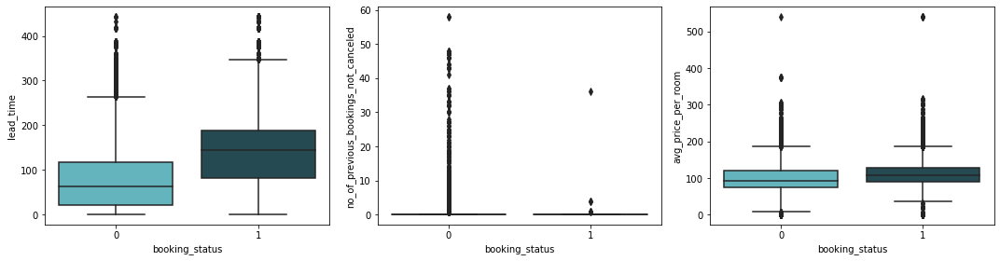

In [62]:
p=df_test.nunique()[df_test.nunique() >cat_threshold].index.tolist()
y=3
x=1

plt.subplots(x,y,figsize=(15,4))

for i in range(1,4) :
    plt.subplot(x,y,i)
    sns.boxplot(data=df_train,y=p[i-1],x='booking_status',palette=['#54C0CC','#1F4F59'])
plt.tight_layout()    
plt.show()

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>Insight</b><br>  Cancelled Bookings have hig median for lead_time and booking_status<br>
 Outliers also present

### <b><span style='color:#DEB078'>8.2 |</span><span style='color:#213502'> Understanding relation with parallel_coordinates plots</span></b>

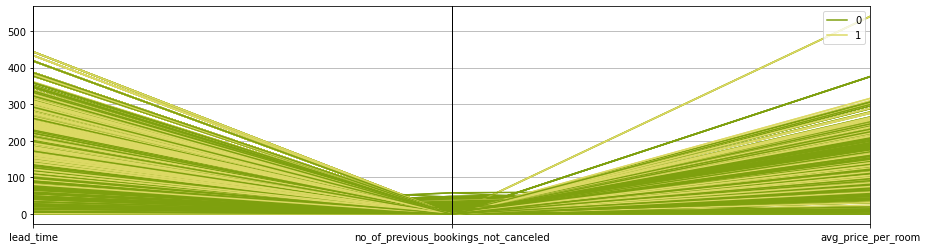

In [63]:
plt.figure(figsize=(15,4)) 
pd.plotting.parallel_coordinates(df_train[p+['booking_status']], "booking_status",color=('#7EA00E','#DCD964'))
plt.show()

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>Insight</b><br>  * Higher lead time tends to have more cancellation then the lower lead time

## <b><div style='padding:15px;background-color:#213502;color:#DEB078;border-radius:2px;font-size:110%;text-align: center'>9 | Relation Matrix and Other Relations</div></b>

### <b><span style='color:#DEB078'>9.1 |</span><span style='color:#213502'> Relation Matrix For Training Data </span></b>

In [64]:
fig = px.imshow(df_train.corr(method='spearman').round(2),zmin=-1,zmax=1, text_auto=True,width=1150,height=750,aspect=None,color_continuous_scale=['#7EA00E','#1F4F59'])
fig.show()

In [65]:
temp_corr=df_train.corr(method='spearman')
res = [(a, b) for idx, a in enumerate(temp_corr.index) for b in temp_corr.index[idx + 1:]]

strong=[]
moderate=[]
weak=[]
no_relationship=[]
for x,y in res:
    p=temp_corr[x][y]
    if p >= 0.75 or p <= -0.75:
        strong.append((x,y))
    elif p >= 0.50 or p <= -0.50:
        moderate.append((x,y))
    elif p >= 0.25 or p <= -0.25:
        weak.append((x,y))
    else :
        no_relationship.append((x,y))
    
print('\nStrong -> ',strong)
print('\nModerate -> ',moderate)


Strong ->  [('repeated_guest', 'no_of_previous_bookings_not_canceled')]

Moderate ->  [('repeated_guest', 'no_of_previous_cancellations')]


<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>Insight:</b> Repeated Guest share strong Relation with no_of_previous_bookings_not_canceled  and no_of_previous_cancellations .</div>

### <b><span style='color:#DEB078'>9.2 |</span><span style='color:#213502'> Relation Matrix For Training Data </span></b>

In [66]:
fig = px.imshow(df_test.corr(method='spearman').round(2),zmin=-1,zmax=1, text_auto=True,width=1150,height=750,aspect=None,color_continuous_scale=['#7EA00E','#1F4F59'])
fig.show()

In [67]:
temp_corr=df_test.corr(method='spearman')
res = [(a, b) for idx, a in enumerate(temp_corr.index) for b in temp_corr.index[idx + 1:]]

strong=[]
moderate=[]
weak=[]
no_relationship=[]
for x,y in res:
    p=temp_corr[x][y]
    if p >= 0.75 or p <= -0.75:
        strong.append((x,y))
    elif p >= 0.50 or p <= -0.50:
        moderate.append((x,y))
    elif p >= 0.25 or p <= -0.25:
        weak.append((x,y))
    else :
        no_relationship.append((x,y))
    
print('\nStrong -> ',strong)
print('\nModerate -> ',moderate)


Strong ->  [('repeated_guest', 'no_of_previous_bookings_not_canceled')]

Moderate ->  [('repeated_guest', 'no_of_previous_cancellations')]


<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;text-align: center;">
<b>Insight:</b> Repeated Guest share strong Relation with no_of_previous_bookings_not_canceled  and no_of_previous_cancellations .</div>

## <b><div style='padding:15px;background-color:#213502;color:#DEB078;border-radius:2px;font-size:110%;text-align: center'>10 | EDA Conclusion</div></b>

<div class="alert alert-block alert-info" style="background-color:white;color:#213502;border-color:#DEB078;width:70%;margin: auto;">
* No null value present in dataset <br>
* No wrong value present in fields (like character in field supposed to be numerical)<br>
* Original Data and Competition data are different as they got separated out by lgbm classifier with 73% roc_auc score <br>
* It can be due to some fields having different value present in Original data compared to Competition.<br>
* Outliers are present in the dataset <br>
* lead time shows good relationship with booking getting cancelled.<br>
* high correlation between  Repeated Guest and  Relation with no_of_previous_bookings_not_canceled  no_of_previous_cancellations .
</div>

## <b><div style='padding:15px;background-color:#213502;color:#DEB078;border-radius:2px;font-size:110%;text-align: center'>11 | LazyPredict</div></b>

### <b><span style='color:#DEB078'>11.1 |</span><span style='color:#213502'> Prepararation of Data For Model  </span></b>

In [68]:
X = df_train.drop('booking_status' , axis =1 )
Y = df_train[['booking_status']]

X_train , X_test , Y_train , Y_test = train_test_split(X , Y, stratify=Y, random_state = 5 ,test_size =0.40)

### <b><span style='color:#DEB078'>11.2 |</span><span style='color:#213502'> Lazypredict Model Fitting   </span></b>

In [69]:
clf = LazyClassifier(verbose=0,
                     ignore_warnings=True,
                     custom_metric=None,
                     predictions=False,
                     random_state=12,
                     classifiers='all')

models, predictions = clf.fit(X_train , X_test , Y_train , Y_test)

100%|██████████| 29/29 [03:45<00:00,  7.76s/it]


### <b><span style='color:#DEB078'>11.2 |</span><span style='color:#213502'> Model Evaluation   </span></b>

In [70]:
models[:15] # Top 15

,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
XGBClassifier,0.82,0.81,0.81,0.82,3.28
LGBMClassifier,0.82,0.81,0.81,0.82,0.38
RandomForestClassifier,0.80,0.79,0.79,0.80,4.33
AdaBoostClassifier,0.79,0.78,0.78,0.79,1.27
SVC,0.79,0.77,0.77,0.79,37.19
ExtraTreesClassifier,0.79,0.77,0.77,0.79,4.28
NuSVC,0.79,0.77,0.77,0.79,51.88
BaggingClassifier,0.78,0.76,0.76,0.78,1.12
KNeighborsClassifier,0.77,0.75,0.75,0.77,9.39


In [71]:
line = px.line(data_frame= models[:15] ,y =['Accuracy','Balanced Accuracy','ROC AUC','F1 Score'] , markers = True)
line.show()

In [72]:
# Work in progress

## <b><div style='padding:15px;background-color:#213502;color:#DEB078;border-radius:2px;font-size:110%;text-align: center'>THANK YOU</div></b>